# Live2D SAM3 25-Epoch Adapter Fine-tune + Comparison

This notebook is for the first longer full-dataset run. It keeps `sam3.pt` read-only, writes lightweight adapter checkpoints at epochs 5/10/15/20/25, plots train/val logs, and compares the base checkpoint with the epoch-25 adapter on the same image.

In [1]:
from pathlib import Path
import contextlib
import hashlib
import json
import os
import random
import shutil
import subprocess
import sys

import numpy as np
import torch
from PIL import Image, ImageDraw
from IPython.display import display
from pycocotools import mask as mask_utils

try:
    import matplotlib.pyplot as plt
    HAS_MPL = True
except Exception as exc:
    HAS_MPL = False
    print('matplotlib unavailable:', exc)

def find_repo_root(start: Path) -> Path:
    for candidate in [start, *start.parents]:
        if (candidate / 'sam3' / 'train' / 'train.py').exists():
            return candidate
    raise RuntimeError('Could not find the SAM3 repository root.')

ROOT = find_repo_root(Path.cwd())
CONFIG = 'configs/live2d/live2d_parts_seg_adapter_25e.yaml'
RUN_DIR = ROOT / 'runs' / 'live2d_parts_seg_adapter_25e'
CKPT_DIR = RUN_DIR / 'checkpoints'
LOG_DIR = RUN_DIR / 'logs' / 'live2d'
DATASET_ROOT = ROOT / 'dataset' / 'live2d_parts_canonical_check'
TAXONOMY_PATH = ROOT / 'scripts' / 'live2d' / 'live2d_canonical_taxonomy.json'
BASE_CKPT = ROOT / 'sam3.pt'
BPE_PATH = ROOT / 'sam3' / 'assets' / 'bpe_simple_vocab_16e6.txt.gz'
OUTPUT_DIR = ROOT / 'runs' / 'live2d_25e_compare'
TRAIN_CMD = [sys.executable, 'sam3/train/train.py', '-c', CONFIG, '--use-cluster', '0', '--num-gpus', '1']

os.environ['PYTHONUTF8'] = '1'
os.environ['PYTHONIOENCODING'] = 'utf-8'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print('repo:', ROOT)
print('config:', ROOT / 'sam3' / 'train' / CONFIG)
print('run dir:', RUN_DIR)
print('python:', sys.executable)
print('torch:', torch.__version__)
print('cuda available:', torch.cuda.is_available())
if torch.cuda.is_available():
    print('gpu:', torch.cuda.get_device_name(0))


repo: D:\github\sam3
config: D:\github\sam3\sam3\train\configs\live2d\live2d_parts_seg_adapter_25e.yaml
run dir: D:\github\sam3\runs\live2d_parts_seg_adapter_25e
python: d:\github\sam3\.venv\Scripts\python.exe
torch: 2.10.0+cu128
cuda available: True
gpu: NVIDIA GeForce RTX 5080


In [2]:
def sha256_file(path: Path, chunk_size: int = 1024 * 1024) -> str:
    h = hashlib.sha256()
    with path.open('rb') as f:
        for chunk in iter(lambda: f.read(chunk_size), b''):
            h.update(chunk)
    return h.hexdigest()

def summarize_coco(split: str):
    ann_path = DATASET_ROOT / split / '_annotations.coco.json'
    data = json.loads(ann_path.read_text(encoding='utf-8'))
    return {
        'split': split,
        'images': len(data.get('images', [])),
        'annotations': len(data.get('annotations', [])),
        'categories': len(data.get('categories', [])),
        'sample_file': data.get('images', [{}])[0].get('file_name'),
    }

required = [ROOT / 'sam3' / 'train' / 'train.py', ROOT / 'sam3' / 'train' / CONFIG, DATASET_ROOT, TAXONOMY_PATH, BASE_CKPT, BPE_PATH]
for path in required:
    print(path, 'OK' if path.exists() else 'MISSING')

base_hash_before = sha256_file(BASE_CKPT)
print('sam3.pt size:', BASE_CKPT.stat().st_size)
print('sam3.pt sha256 before:', base_hash_before)

for split in ['train', 'val', 'test']:
    print(json.dumps(summarize_coco(split), indent=2, ensure_ascii=False))


D:\github\sam3\sam3\train\train.py OK
D:\github\sam3\sam3\train\configs\live2d\live2d_parts_seg_adapter_25e.yaml OK
D:\github\sam3\dataset\live2d_parts_canonical_check OK
D:\github\sam3\scripts\live2d\live2d_canonical_taxonomy.json OK
D:\github\sam3\sam3.pt OK
D:\github\sam3\sam3\assets\bpe_simple_vocab_16e6.txt.gz OK


sam3.pt size: 3450062241
sam3.pt sha256 before: 9999e2341ceef5e136daa386eecb55cb414446a00ac2b55eb2dfd2f7c3cf8c9e
{
  "split": "train",
  "images": 14,
  "annotations": 171,
  "categories": 24,
  "sample_file": "rrailab_000001_rrailab_000001_04_rrailab_000001_0a96ea1f.png"
}
{
  "split": "val",
  "images": 2,
  "annotations": 25,
  "categories": 24,
  "sample_file": "地雷系 十六夜咲夜_3e81bb24.png"
}
{
  "split": "test",
  "images": 2,
  "annotations": 21,
  "categories": 24,
  "sample_file": "rrailab_000002_rrailab_000002_04_rrailab_000002_9f2a1b06.png"
}


## Launch Training

Set `RUN_TRAIN = True` to launch the 25-epoch full-dataset run from this notebook. `FRESH_RUN = True` removes only this run directory before training; leave it `False` if you want resume behavior.

In [3]:
RUN_TRAIN = False
FRESH_RUN = False

if FRESH_RUN and RUN_DIR.exists():
    resolved_run = RUN_DIR.resolve()
    resolved_root = ROOT.resolve()
    assert resolved_root in resolved_run.parents, f'Unsafe run dir: {resolved_run}'
    assert resolved_run.name == 'live2d_parts_seg_adapter_25e', f'Unexpected run dir: {resolved_run}'
    shutil.rmtree(resolved_run)
    print('removed:', resolved_run)

if RUN_TRAIN:
    env = os.environ.copy()
    env['PYTHONUTF8'] = '1'
    env['PYTHONIOENCODING'] = 'utf-8'
    print('running:', ' '.join(TRAIN_CMD))
    result = subprocess.run(TRAIN_CMD, cwd=ROOT, env=env)
    print('return code:', result.returncode)
    if result.returncode != 0:
        raise RuntimeError('Fine-tune failed. Check the traceback above or logs under runs/live2d_parts_seg_adapter_25e.')
else:
    print('training not launched from notebook. Set RUN_TRAIN = True to run it here.')


training not launched from notebook. Set RUN_TRAIN = True to run it here.


## Logs, Checkpoints, and Curves

train records: 25
val records: 5
expected epoch checkpoints:
  checkpoint_5.pt  OK          35.38 MB
  checkpoint_10.pt OK          35.38 MB
  checkpoint_15.pt OK          35.38 MB
  checkpoint_20.pt OK          35.38 MB
  checkpoint_25.pt OK          35.38 MB
latest/resume: D:\github\sam3\runs\live2d_parts_seg_adapter_25e\checkpoints\checkpoint.pt 35.38 MB
wrote: D:\github\sam3\runs\live2d_25e_compare\loss_and_val_curves.png


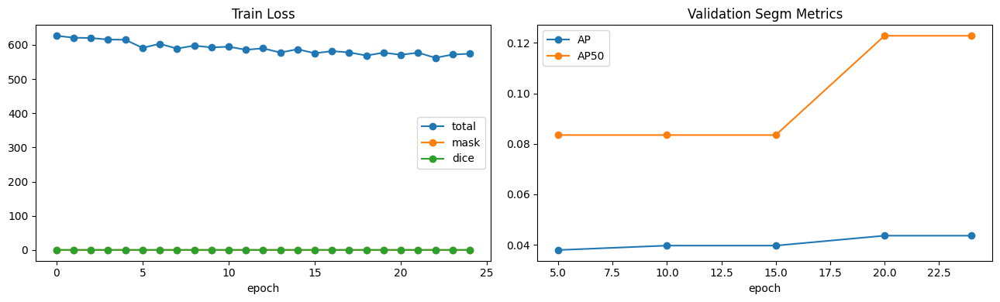

In [4]:
def read_json_records(path: Path):
    if not path.exists():
        return []
    text = path.read_text(encoding='utf-8', errors='replace').strip()
    if not text:
        return []
    try:
        data = json.loads(text)
        if isinstance(data, list):
            return data
        if isinstance(data, dict):
            return [data]
    except json.JSONDecodeError:
        pass
    records = []
    for line in text.splitlines():
        line = line.strip()
        if not line:
            continue
        try:
            records.append(json.loads(line))
        except json.JSONDecodeError:
            continue
    return records

def values(records, key):
    xs, ys = [], []
    for index, record in enumerate(records):
        if key in record:
            xs.append(record.get('Trainer/epoch', index))
            ys.append(record[key])
    return xs, ys

train_records = read_json_records(LOG_DIR / 'train_stats.json')
val_records = read_json_records(LOG_DIR / 'val_stats.json')
print('train records:', len(train_records))
print('val records:', len(val_records))

expected = [CKPT_DIR / f'checkpoint_{epoch}.pt' for epoch in [5, 10, 15, 20, 25]]
print('expected epoch checkpoints:')
for path in expected:
    status = 'OK' if path.exists() else 'MISSING'
    size_mb = path.stat().st_size / 1024**2 if path.exists() else 0
    print(f'  {path.name:16s} {status:8s} {size_mb:8.2f} MB')
latest = CKPT_DIR / 'checkpoint.pt'
if latest.exists():
    print('latest/resume:', latest, f'{latest.stat().st_size / 1024**2:.2f} MB')

if HAS_MPL and (train_records or val_records):
    fig, axes = plt.subplots(1, 2, figsize=(13, 4))
    for key, label in [
        ('Losses/train_all_loss', 'total'),
        ('Losses/train_all_loss_mask', 'mask'),
        ('Losses/train_all_loss_dice', 'dice'),
    ]:
        xs, ys = values(train_records, key)
        if ys:
            axes[0].plot(xs, ys, marker='o', label=label)
    axes[0].set_title('Train Loss')
    axes[0].set_xlabel('epoch')
    axes[0].legend()
    for key, label in [
        ('Meters_train\\val_live2d/detection\\coco_eval_segm_AP', 'AP'),
        ('Meters_train\\val_live2d/detection\\coco_eval_segm_AP_50', 'AP50'),
    ]:
        xs, ys = values(val_records, key)
        if ys:
            axes[1].plot(xs, ys, marker='o', label=label)
    axes[1].set_title('Validation Segm Metrics')
    axes[1].set_xlabel('epoch')
    axes[1].legend()
    fig.tight_layout()
    curve_path = OUTPUT_DIR / 'loss_and_val_curves.png'
    fig.savefig(curve_path, dpi=160)
    print('wrote:', curve_path)
    plt.show()
elif not HAS_MPL:
    print('Install matplotlib if you want curves in this notebook.')


## Prompt-Bank Inference Utilities

device: cuda
image: D:\github\sam3\dataset\live2d_parts_canonical_check\val\地雷系 十六夜咲夜_3e81bb24.png (3035, 4299)
adapter checkpoint: D:\github\sam3\runs\live2d_parts_seg_adapter_25e\checkpoints\checkpoint_25.pt OK
face          : ['face', 'face skin', 'base face']
eyes          : ['eyes', 'eye', 'eyelash']
mouth         : ['mouth', 'lip', 'lips']
front hair    : ['front hair', 'bangs', 'fringe']
side hair     : ['side hair', 'hair side', 'side locks']
back hair     : ['back hair', 'rear hair', 'hair back']
upper clothes : ['upper clothes', 'clothes upper', 'shirt']
lower clothes : ['lower clothes', 'skirt', 'pants']
arms          : ['arms', 'arm', 'upper arm']
hands         : ['hands', 'hand', 'finger']
legs          : ['legs', 'leg', 'thigh']
feet          : ['feet', 'foot', 'toe']
ears          : ['ears', 'ear', 'animal ears']
tail          : ['tail', 'tails', 'しっぽ']
accessory     : ['accessory', 'accessories', 'ribbon']


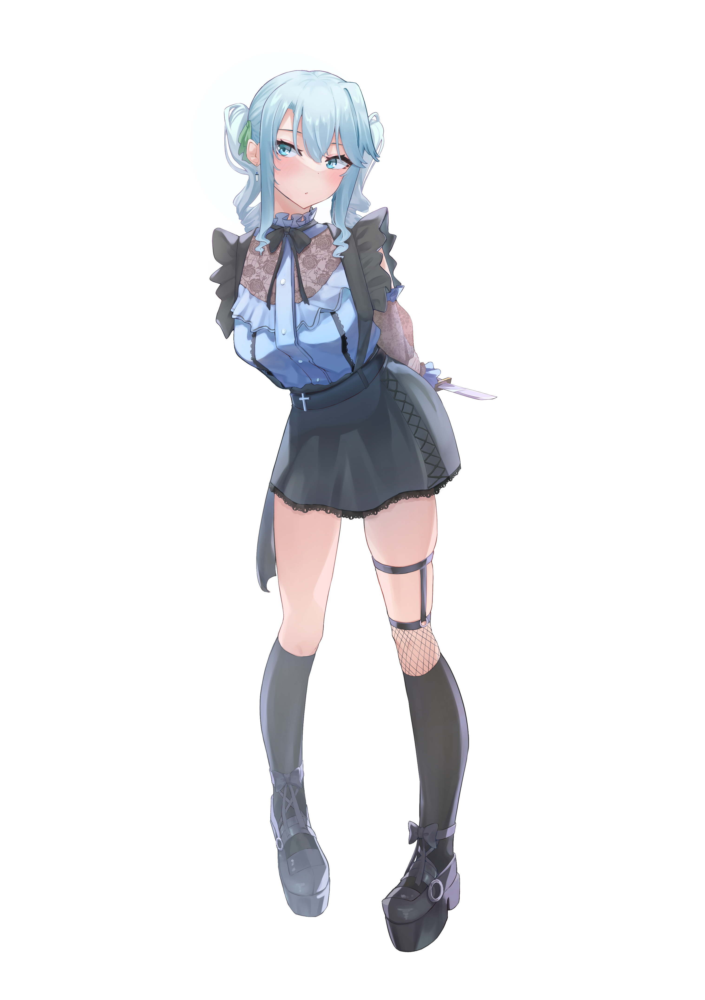

In [5]:
taxonomy = json.loads(TAXONOMY_PATH.read_text(encoding='utf-8'))
categories_all = taxonomy['categories']
category_by_name = {c['name']: c for c in categories_all}

PROMPT_CLASSES = [
    'face', 'eyes', 'mouth', 'front hair', 'side hair', 'back hair',
    'upper clothes', 'lower clothes', 'arms', 'hands', 'legs', 'feet',
    'ears', 'tail', 'accessory',
]
categories = [category_by_name[name] for name in PROMPT_CLASSES if name in category_by_name]
MAX_ALIASES_PER_CLASS = 3
CONFIDENCE_THRESHOLD = 0.35
IOU_DEDUP_THRESHOLD = 0.85
MIN_MASK_AREA = 16
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

def inference_precision_context():
    if DEVICE == 'cuda':
        return torch.amp.autocast(device_type='cuda', dtype=torch.bfloat16)
    return contextlib.nullcontext()


val_ann = json.loads((DATASET_ROOT / 'val' / '_annotations.coco.json').read_text(encoding='utf-8'))
IMAGE_PATH = DATASET_ROOT / 'val' / val_ann['images'][0]['file_name']
ADAPTER_CHECKPOINT = CKPT_DIR / 'checkpoint_25.pt'
RUN_COMPARISON_INFERENCE = 'auto'  # True, False, or 'auto' to run when checkpoint_25.pt exists.

def build_prompt_bank(categories, max_aliases=3):
    bank = {}
    for category in categories:
        prompts = []
        for value in [category['name'], *category.get('aliases', [])]:
            value = str(value).replace('_', ' ').strip()
            if value and value not in prompts:
                prompts.append(value)
        ascii_prompts = [p for p in prompts if p.isascii()]
        non_ascii_prompts = [p for p in prompts if not p.isascii()]
        ordered = ascii_prompts + non_ascii_prompts
        bank[category['name']] = ordered[:max_aliases] if max_aliases else ordered
    return bank

prompt_bank = build_prompt_bank(categories, MAX_ALIASES_PER_CLASS)
image = Image.open(IMAGE_PATH).convert('RGB')
width, height = image.size
print('device:', DEVICE)
print('image:', IMAGE_PATH, image.size)
print('adapter checkpoint:', ADAPTER_CHECKPOINT, 'OK' if ADAPTER_CHECKPOINT.exists() else 'MISSING')
for name, prompts in prompt_bank.items():
    print(f'{name:14s}: {prompts}')
display(image)


In [6]:
def tensor_to_numpy(value):
    if value is None:
        return None
    if isinstance(value, torch.Tensor):
        value = value.detach()
        if value.dtype == torch.bfloat16:
            value = value.float()
        return value.cpu().numpy()
    return np.asarray(value)

def mask_iou(a, b):
    inter = np.logical_and(a, b).sum()
    union = np.logical_or(a, b).sum()
    return float(inter / union) if union else 0.0

def dedupe_predictions(predictions, threshold=0.85):
    kept = []
    for pred in sorted(predictions, key=lambda x: x['score'], reverse=True):
        same_class = [p for p in kept if p['category_id'] == pred['category_id']]
        if any(mask_iou(pred['mask'], p['mask']) >= threshold for p in same_class):
            continue
        kept.append(pred)
    return kept

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return [0.0, 0.0, 0.0, 0.0]
    x0, x1 = xs.min(), xs.max()
    y0, y1 = ys.min(), ys.max()
    return [float(x0), float(y0), float(x1 - x0 + 1), float(y1 - y0 + 1)]

def encode_rle(mask):
    encoded = mask_utils.encode(np.asfortranarray(mask.astype(np.uint8)))
    encoded['counts'] = encoded['counts'].decode('ascii')
    return encoded

def state_to_predictions(state, category, prompt):
    masks = tensor_to_numpy(state.get('masks'))
    boxes = tensor_to_numpy(state.get('boxes'))
    scores = tensor_to_numpy(state.get('scores'))
    if masks is None or len(masks) == 0:
        return []
    masks = np.asarray(masks).astype(bool)
    if masks.ndim == 4:
        masks = masks[:, 0]
    if boxes is None:
        boxes = np.array([mask_to_bbox(mask) for mask in masks], dtype=np.float32)
    if scores is None:
        scores = np.ones((len(masks),), dtype=np.float32)
    preds = []
    for mask, box, score in zip(masks, boxes, scores):
        area = int(mask.sum())
        if area < MIN_MASK_AREA:
            continue
        preds.append({
            'category_id': int(category['id']),
            'category_name': category['name'],
            'prompt': prompt,
            'score': float(score),
            'bbox_xyxy': [float(x) for x in box.tolist()],
            'mask': mask,
            'area': area,
        })
    return preds

def predictions_to_coco(predictions, image_path, width, height, categories):
    annotations = []
    for ann_id, pred in enumerate(predictions, start=1):
        annotations.append({
            'id': ann_id,
            'image_id': 1,
            'category_id': pred['category_id'],
            'segmentation': encode_rle(pred['mask']),
            'area': int(pred['mask'].sum()),
            'bbox': mask_to_bbox(pred['mask']),
            'iscrowd': 0,
            'score': pred['score'],
            'attributes': {'category_name': pred['category_name'], 'prompt': pred['prompt']},
        })
    return {
        'images': [{'id': 1, 'file_name': Path(image_path).name, 'width': width, 'height': height}],
        'annotations': annotations,
        'categories': [{'id': int(c['id']), 'name': c['name'], 'supercategory': 'live2d_parts'} for c in categories],
    }

def color_for_category(category_id):
    rng = random.Random(category_id * 1009)
    return tuple(rng.randint(40, 235) for _ in range(3))

def render_overlay(image, predictions, alpha=0.46):
    base = image.convert('RGBA')
    overlay = Image.new('RGBA', base.size, (0, 0, 0, 0))
    for pred in sorted(predictions, key=lambda x: x['area'], reverse=True):
        color = color_for_category(pred['category_id'])
        mask_img = Image.fromarray((pred['mask'] * int(255 * alpha)).astype(np.uint8), mode='L')
        fill = Image.new('RGBA', base.size, (*color, 0))
        fill.putalpha(mask_img)
        overlay = Image.alpha_composite(overlay, fill)
    out = Image.alpha_composite(base, overlay)
    draw = ImageDraw.Draw(out)
    for pred in predictions:
        x, y, w, h = mask_to_bbox(pred['mask'])
        color = color_for_category(pred['category_id'])
        draw.rectangle([x, y, x + w, y + h], outline=color, width=2)
        label = f"{pred['category_name']} {pred['score']:.2f}"
        draw.text((x + 2, y + 2), label, fill=(255, 255, 255, 255), stroke_width=2, stroke_fill=(0, 0, 0, 220))
    return out.convert('RGB')

def make_grid(items):
    tiles = []
    for label, img in items:
        tile = img.copy().convert('RGB')
        banner = Image.new('RGB', (tile.width, 34), (25, 25, 25))
        draw = ImageDraw.Draw(banner)
        draw.text((10, 9), label, fill=(255, 255, 255))
        combined = Image.new('RGB', (tile.width, tile.height + banner.height), (255, 255, 255))
        combined.paste(banner, (0, 0))
        combined.paste(tile, (0, banner.height))
        tiles.append(combined)
    out = Image.new('RGB', (sum(t.width for t in tiles), max(t.height for t in tiles)), (255, 255, 255))
    x = 0
    for tile in tiles:
        out.paste(tile, (x, 0))
        x += tile.width
    return out


## Base vs Adapter Comparison

d:\github\sam3\.venv\Lib\site-packages\timm\models\layers\__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


loading base model for base


base       | face           | face                     | 1 masks
base       | face           | face skin                | 1 masks
base       | face           | base face                | 0 masks
base       | eyes           | eyes                     | 3 masks


base       | eyes           | eye                      | 2 masks
base       | eyes           | eyelash                  | 3 masks


base       | mouth          | mouth                    | 0 masks
base       | mouth          | lip                      | 0 masks
base       | mouth          | lips                     | 0 masks
base       | front hair     | front hair               | 1 masks
base       | front hair     | bangs                    | 1 masks


base       | front hair     | fringe                   | 0 masks
base       | side hair      | side hair                | 1 masks
base       | side hair      | hair side                | 1 masks
base       | side hair      | side locks               | 0 masks


base       | back hair      | back hair                | 1 masks
base       | back hair      | rear hair                | 0 masks
base       | back hair      | hair back                | 0 masks
base       | upper clothes  | upper clothes            | 2 masks
base       | upper clothes  | clothes upper            | 1 masks


base       | upper clothes  | shirt                    | 0 masks
base       | lower clothes  | lower clothes            | 0 masks
base       | lower clothes  | skirt                    | 1 masks
base       | lower clothes  | pants                    | 0 masks


base       | arms           | arms                     | 0 masks
base       | arms           | arm                      | 1 masks
base       | arms           | upper arm                | 1 masks
base       | hands          | hands                    | 0 masks


base       | hands          | hand                     | 2 masks
base       | hands          | finger                   | 0 masks
base       | legs           | legs                     | 7 masks


base       | legs           | leg                      | 6 masks
base       | legs           | thigh                    | 2 masks


base       | feet           | feet                     | 2 masks
base       | feet           | foot                     | 2 masks
base       | feet           | toe                      | 0 masks
base       | ears           | ears                     | 1 masks


base       | ears           | ear                      | 1 masks
base       | ears           | animal ears              | 0 masks
base       | tail           | tail                     | 0 masks
base       | tail           | tails                    | 0 masks
base       | tail           | しっぽ                      | 0 masks


base       | accessory      | accessory                | 12 masks
base       | accessory      | accessories              | 11 masks
base       | accessory      | ribbon                   | 3 masks


base predictions: 44
wrote: D:\github\sam3\runs\live2d_25e_compare\地雷系 十六夜咲夜_3e81bb24_base_predictions.coco.json
wrote: D:\github\sam3\runs\live2d_25e_compare\地雷系 十六夜咲夜_3e81bb24_base_overlay.png
wrote: D:\github\sam3\runs\live2d_25e_compare\地雷系 十六夜咲夜_3e81bb24_base_summary.json
loading base model for adapter_e25


adapter_e25 loaded adapter tensors: 38
adapter_e25 missing keys: 1096 unexpected keys: 0
adapter_e25 | face           | face                     | 1 masks


adapter_e25 | face           | face skin                | 1 masks
adapter_e25 | face           | base face                | 0 masks
adapter_e25 | eyes           | eyes                     | 3 masks
adapter_e25 | eyes           | eye                      | 2 masks


adapter_e25 | eyes           | eyelash                  | 3 masks


adapter_e25 | mouth          | mouth                    | 0 masks
adapter_e25 | mouth          | lip                      | 0 masks
adapter_e25 | mouth          | lips                     | 0 masks
adapter_e25 | front hair     | front hair               | 1 masks
adapter_e25 | front hair     | bangs                    | 0 masks


adapter_e25 | front hair     | fringe                   | 0 masks
adapter_e25 | side hair      | side hair                | 1 masks
adapter_e25 | side hair      | hair side                | 1 masks
adapter_e25 | side hair      | side locks               | 0 masks


adapter_e25 | back hair      | back hair                | 1 masks
adapter_e25 | back hair      | rear hair                | 0 masks
adapter_e25 | back hair      | hair back                | 0 masks
adapter_e25 | upper clothes  | upper clothes            | 2 masks


adapter_e25 | upper clothes  | clothes upper            | 1 masks
adapter_e25 | upper clothes  | shirt                    | 0 masks
adapter_e25 | lower clothes  | lower clothes            | 0 masks
adapter_e25 | lower clothes  | skirt                    | 1 masks


adapter_e25 | lower clothes  | pants                    | 0 masks
adapter_e25 | arms           | arms                     | 0 masks
adapter_e25 | arms           | arm                      | 1 masks
adapter_e25 | arms           | upper arm                | 0 masks
adapter_e25 | hands          | hands                    | 0 masks


adapter_e25 | hands          | hand                     | 1 masks
adapter_e25 | hands          | finger                   | 0 masks
adapter_e25 | legs           | legs                     | 7 masks


adapter_e25 | legs           | leg                      | 6 masks
adapter_e25 | legs           | thigh                    | 2 masks


adapter_e25 | feet           | feet                     | 2 masks
adapter_e25 | feet           | foot                     | 2 masks
adapter_e25 | feet           | toe                      | 0 masks


adapter_e25 | ears           | ears                     | 1 masks
adapter_e25 | ears           | ear                      | 1 masks
adapter_e25 | ears           | animal ears              | 0 masks
adapter_e25 | tail           | tail                     | 0 masks
adapter_e25 | tail           | tails                    | 0 masks


adapter_e25 | tail           | しっぽ                      | 0 masks
adapter_e25 | accessory      | accessory                | 10 masks


adapter_e25 | accessory      | accessories              | 11 masks
adapter_e25 | accessory      | ribbon                   | 3 masks


adapter_e25 predictions: 41
wrote: D:\github\sam3\runs\live2d_25e_compare\地雷系 十六夜咲夜_3e81bb24_adapter_e25_predictions.coco.json
wrote: D:\github\sam3\runs\live2d_25e_compare\地雷系 十六夜咲夜_3e81bb24_adapter_e25_overlay.png
wrote: D:\github\sam3\runs\live2d_25e_compare\地雷系 十六夜咲夜_3e81bb24_adapter_e25_summary.json


wrote: D:\github\sam3\runs\live2d_25e_compare\地雷系 十六夜咲夜_3e81bb24_base_vs_adapter_e25.png


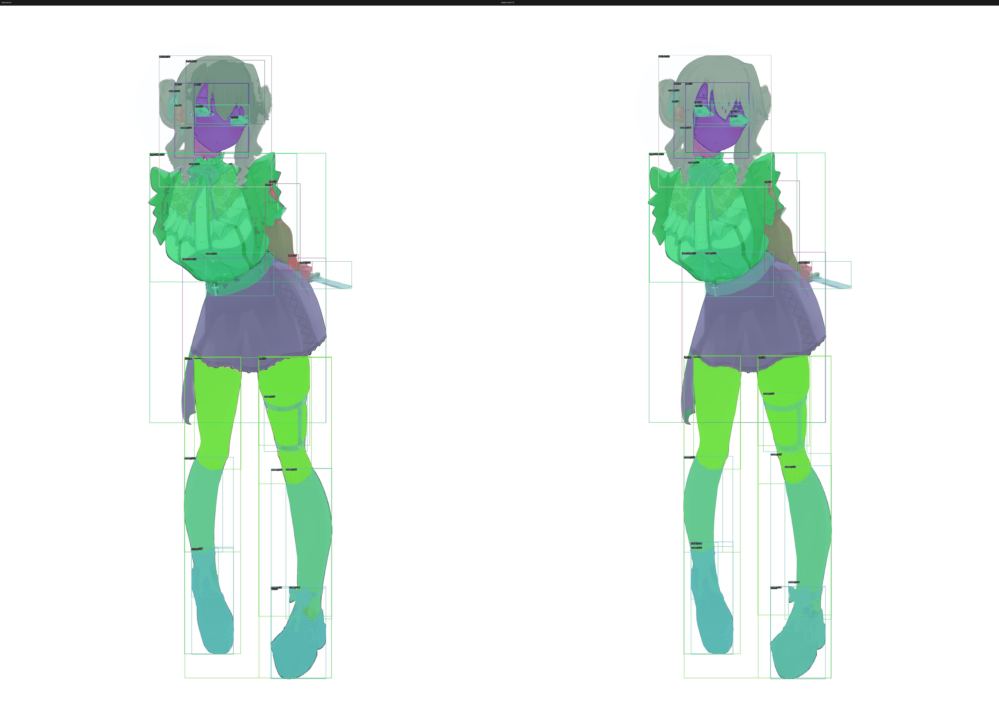

In [7]:
def scan_with_checkpoint(label, adapter_path=None):
    from sam3 import build_sam3_image_model
    from sam3.model.sam3_image_processor import Sam3Processor

    print('loading base model for', label)
    model = build_sam3_image_model(
        bpe_path=str(BPE_PATH),
        checkpoint_path=str(BASE_CKPT),
        load_from_HF=False,
        device=DEVICE,
        eval_mode=True,
        enable_segmentation=True,
    )
    if adapter_path is not None:
        state = torch.load(adapter_path, map_location='cpu')
        missing, unexpected = model.load_state_dict(state['model'], strict=False)
        print(label, 'loaded adapter tensors:', len(state['model']))
        print(label, 'missing keys:', len(missing), 'unexpected keys:', len(unexpected))
    model.eval()
    processor = Sam3Processor(model, device=DEVICE, confidence_threshold=CONFIDENCE_THRESHOLD)
    with inference_precision_context():
        inference_state = processor.set_image(image)

    all_predictions = []
    with torch.inference_mode(), inference_precision_context():
        for category in categories:
            class_predictions = []
            for prompt in prompt_bank[category['name']]:
                processor.reset_all_prompts(inference_state)
                state = processor.set_text_prompt(prompt=prompt, state=inference_state)
                preds = state_to_predictions(state, category, prompt)
                class_predictions.extend(preds)
                print(f'{label:10s} | {category["name"]:14s} | {prompt:24s} | {len(preds)} masks')
            class_predictions = dedupe_predictions(class_predictions, IOU_DEDUP_THRESHOLD)
            all_predictions.extend(class_predictions)
    all_predictions = dedupe_predictions(all_predictions, IOU_DEDUP_THRESHOLD)

    coco = predictions_to_coco(all_predictions, IMAGE_PATH, width, height, categories)
    coco_path = OUTPUT_DIR / f'{IMAGE_PATH.stem}_{label}_predictions.coco.json'
    overlay_path = OUTPUT_DIR / f'{IMAGE_PATH.stem}_{label}_overlay.png'
    summary_path = OUTPUT_DIR / f'{IMAGE_PATH.stem}_{label}_summary.json'
    coco_path.write_text(json.dumps(coco, ensure_ascii=False, indent=2), encoding='utf-8')
    summary = [{k: v for k, v in pred.items() if k != 'mask'} for pred in all_predictions]
    summary_path.write_text(json.dumps(summary, ensure_ascii=False, indent=2), encoding='utf-8')
    overlay = render_overlay(image, all_predictions)
    overlay.save(overlay_path)
    print(label, 'predictions:', len(all_predictions))
    print('wrote:', coco_path)
    print('wrote:', overlay_path)
    print('wrote:', summary_path)

    del processor, model
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return overlay, all_predictions

should_run = RUN_COMPARISON_INFERENCE is True or (RUN_COMPARISON_INFERENCE == 'auto' and ADAPTER_CHECKPOINT.exists())
if not should_run:
    print('comparison inference skipped. Set RUN_COMPARISON_INFERENCE = True after the adapter checkpoint exists.')
else:
    base_overlay, base_predictions = scan_with_checkpoint('base')
    adapter_overlay, adapter_predictions = scan_with_checkpoint('adapter_e25', ADAPTER_CHECKPOINT)
    grid = make_grid([('base sam3.pt', base_overlay), ('adapter epoch 25', adapter_overlay)])
    grid_path = OUTPUT_DIR / f'{IMAGE_PATH.stem}_base_vs_adapter_e25.png'
    grid.save(grid_path)
    print('wrote:', grid_path)
    display(grid)


## Safety Check

This confirms the original `sam3.pt` was not changed by training or comparison inference.

In [8]:
base_hash_after = sha256_file(BASE_CKPT)
print('sam3.pt sha256 after:', base_hash_after)
assert base_hash_after == base_hash_before, 'sam3.pt changed; stop and inspect before continuing.'
print('OK: base sam3.pt is unchanged.')


sam3.pt sha256 after: 9999e2341ceef5e136daa386eecb55cb414446a00ac2b55eb2dfd2f7c3cf8c9e
OK: base sam3.pt is unchanged.
